In [82]:
import math
import cv2
import seaborn as sns

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm
import random
from threading import Thread
import os 
import json

In [83]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'NanumGothic'

In [84]:
def xywh2xyxy(xywh,w,h, rounding = True):
    xywh = [float(i) for i in xywh]

    if rounding:
        xyxy = [round((xywh[0] - xywh[2]/2) * w),round((xywh[1] - xywh[3]/2) * h),round((xywh[0] + xywh[2]/2) * w),round((xywh[1] + xywh[3]/2) * h)]
        if xyxy[0] > xyxy[2]:
            temp = xyxy[0]
            xyxy[0] = xyxy[2]
            xyxy[2] = temp
        if xyxy[1] > xyxy[3]:
            temp = xyxy[1]
            xyxy[1] = xyxy[3]
            xyxy[1] = temp
        return xyxy
    else:
        return [(xywh[0] - xywh[2]/2) * w ,(xywh[1] - xywh[3]/2) * h ,(xywh[0] + xywh[2]/2) * w ,(xywh[1] + xywh[3]/2) * h]


In [85]:
labels1 = glob('../../datasets/aihub_safety/val/*/*/5.전체/*.json')
labels2 = glob('../../datasets/aihub_safety/val/*/5.전체/*.json')
labels = labels1 + labels2 
# images1 = glob('../../datasets/aihub_safety/val/*/*.jpg')
# images2 = glob('../../datasets/aihub_safety/val/*/*/*.jpg')
# imgs = images1 + images2

imgs = [i.replace('라벨','원천').replace('/5.전체','').replace('json', 'jpg') for i in labels]

In [86]:
print(len(imgs), len(labels))
imgs.sort()
labels.sort()
random.seed(42)
random.shuffle(imgs)
random.seed(42)
random.shuffle(labels)
print(imgs[:5])
print(labels[:5])

20055 20055
['../../datasets/aihub_safety/val/[원천]1.공동주택/서대문/S2-N1901M19390.jpg', '../../datasets/aihub_safety/val/[원천]3.공장_가산동 A1타워 지식산업 센터/S2-O1101M00061.jpg', '../../datasets/aihub_safety/val/[원천]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사/S2-N0508M11803.jpg', '../../datasets/aihub_safety/val/[원천]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사/S2-N0506M44760.jpg', '../../datasets/aihub_safety/val/[원천]5.물류센터/인천공항 화물터미널E/S2-N0305M14037.jpg']
['../../datasets/aihub_safety/val/[라벨]1.공동주택/서대문/5.전체/S2-N1901M19390.json', '../../datasets/aihub_safety/val/[라벨]3.공장_가산동 A1타워 지식산업 센터/5.전체/S2-O1101M00061.json', '../../datasets/aihub_safety/val/[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사/5.전체/S2-N0508M11803.json', '../../datasets/aihub_safety/val/[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사/5.전체/S2-N0506M44760.json', '../../datasets/aihub_safety/val/[라벨]5.물류센터/인천공항 화물터미널E/5.전체/S2-N0305M14037.json']


In [87]:
indice= np.arange(0,20055,2000)


In [88]:
indice

array([    0,  2000,  4000,  6000,  8000, 10000, 12000, 14000, 16000,
       18000, 20000])

In [89]:
def coord_organize(box):
    return [min(box[0],box[2]), min(box[1],box[3]), max(box[0],box[2]), max(box[1],box[3])]

def cvt_yoloformat(xyxy,w,h):
    box_w = xyxy[2] - xyxy[0]
    box_h = xyxy[3] - xyxy[1]
    return [(xyxy[0] + box_w/2)/w ,(xyxy[1] + box_h/2)/h, box_w/w, box_h/h ]

def xywh2xyxy(xywh,w,h, rounding = True):
    xywh = [float(i) for i in xywh]

    if rounding:
        xyxy = [round((xywh[0] - xywh[2]/2) * w),round((xywh[1] - xywh[3]/2) * h),round((xywh[0] + xywh[2]/2) * w),round((xywh[1] + xywh[3]/2) * h)]
        if xyxy[0] > xyxy[2]:
            temp = xyxy[0]
            xyxy[0] = xyxy[2]
            xyxy[2] = temp
        if xyxy[1] > xyxy[3]:
            temp = xyxy[1]
            xyxy[1] = xyxy[3]
            xyxy[1] = temp
        return xyxy
    else:
        return [(xywh[0] - xywh[2]/2) * w ,(xywh[1] - xywh[3]/2) * h ,(xywh[0] + xywh[2]/2) * w ,(xywh[1] + xywh[3]/2) * h]

In [92]:
def cropping_img(start_idx,end_idx,results,k): # for reading json file 
    global imgs, labels
    cropped_imgs = {1 : [], 2:[] , '1name' : [], '2name' : []}

    for i in range(start_idx,end_idx):
        img = cv2.imread(imgs[i])[...,::-1]
        img_w = img.shape[1]
        img_h = img.shape[0]

        w, h = img.shape[1] , img.shape[0]

        j = labels[i]
        try:
            with open(j, 'r',encoding='utf-8-sig') as f:
                data = json.load(f)
                annos = data['annotations']
        except Exception as e:
            print(e)
            try:
                with open(j, 'r') as f:
                    data = json.load(f)
                    annos = data['annotations']
            except Exception as e:
                print(e, '\n json data 읽기 실패')
                continue

        data_extst = False
        new_datas = []
        
        if len(annos):
            for anno in annos:
                try:
                    cls = int(anno['class'] )
                    box = anno['box']
                except:
                    continue
                    cls = None
                    box = []

                if cls not in [7,8]:
                    continue


                xyxy = box
                # box = coord_organize(box)
                # xyxy = xywh2xyxy(box,w,h)
                cropped_img = img[xyxy[1]:xyxy[3],xyxy[0]:xyxy[2],:]
                cropped_imgs[cls - 6].append(cropped_img)
                
                if cls == 7:
                    cropped_imgs['1name'].append(os.path.dirname(imgs[i]).split('/')[-1])
                    # cropped_imgs['1name'].append(os.path.basename(imgs[i]))
                else:
                    cropped_imgs['2name'].append(os.path.dirname(imgs[i]).split('/')[-1])
                    # cropped_imgs['2name'].append(os.path.basename(imgs[i]))
                # new_data = str(int(cls) - 1) + ' ' + ' '.join(str(k) for k in box)  + '\n'
    
                # new_datas.append(new_data)


        # for anno in annos:
        #     anno = anno.strip().split(' ')
            
        #     cls = int(anno[0])
        #     if cls not in [6,7]:
        #         continue
        #     coord = anno[1:]
        #     xyxy = xywh2xyxy(coord,img_w,img_h)


    results[k] = cropped_imgs
    



In [93]:
start_idx = 0
end_idx = 2001
indice = list(range(start_idx,end_idx,end_idx//10))


results = [None] * 10
threads = [None] * 10
for i in range(10):
    threads[i] = Thread(target=cropping_img,args=(indice[i],indice[i+1],results,i))
    threads[i].start()
for i in range(len(threads)):
    threads[i].join()



In [97]:
result = {1 : [], 2: [], '1name': [], '2name' : []}
for i in range(10):
    result[1] += results[i][1]
    result[2] += results[i][2]
    result['1name'] += results[i]['1name']
    result['2name'] += results[i]['2name']

In [99]:
result[2]

[array([[[110,  80,  78],
         [103,  73,  71],
         [115,  85,  85],
         ...,
         [129,  65,  63],
         [132,  68,  66],
         [131,  67,  65]],
 
        [[115,  84,  81],
         [101,  70,  67],
         [113,  82,  80],
         ...,
         [133,  69,  67],
         [136,  72,  70],
         [134,  70,  68]],
 
        [[146, 111, 105],
         [138, 105,  98],
         [141, 108, 103],
         ...,
         [138,  77,  74],
         [138,  77,  74],
         [137,  76,  75]],
 
        ...,
 
        [[ 68,  62,  62],
         [ 62,  58,  57],
         [ 60,  59,  57],
         ...,
         [ 25,  23,  28],
         [ 32,  30,  35],
         [ 30,  28,  33]],
 
        [[ 68,  62,  62],
         [ 69,  65,  64],
         [ 66,  65,  63],
         ...,
         [ 24,  19,  26],
         [ 33,  28,  35],
         [ 39,  34,  40]],
 
        [[ 71,  65,  65],
         [ 77,  73,  72],
         [ 71,  69,  70],
         ...,
         [ 33,  28,  35],
  

In [107]:
print(len(result[1]),len(result['1name']))
print(len(result[2]),len(result['2name']))

1933 1933
540 540


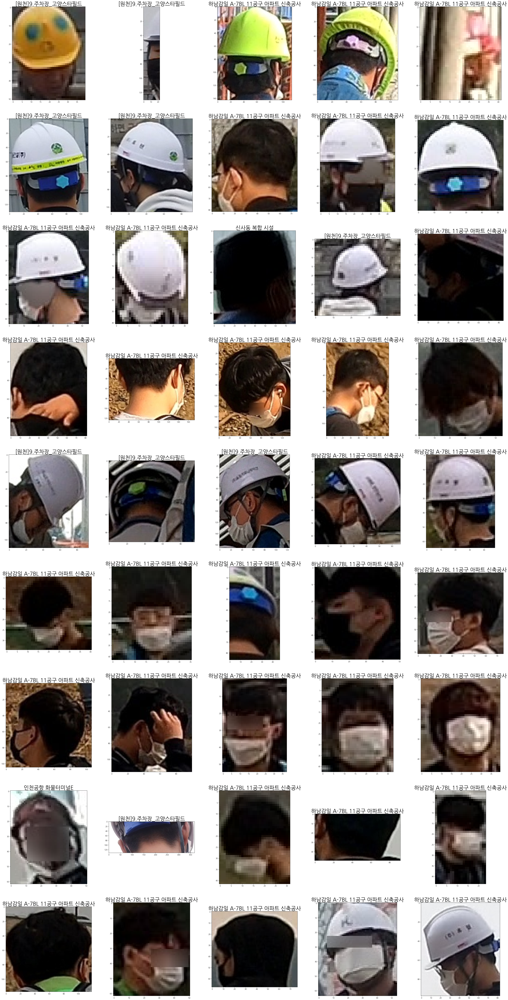

In [117]:
alpha = 450

plt.figure(figsize=(50,100))
for num in range(45):
    plt.subplot(9,5,num+1)
    plt.title(result['2name'][num+alpha],fontdict = {'fontsize' : 30})
    plt.imshow(result[2][num + alpha])

# 1 2 3 4 5 10 11 12 13 14  16 18 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 40 41 42 43 44

In [11]:
# strange_idx = '1 2 3 4 5 10 11 12 13 14 16 18 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 40 41 42 43 44'.split(' ')

# strange_idx = [int(i) for i in strange_idx]

In [12]:
images = glob('../../datasets/aihub_safety/train/*/*.jpg')

In [59]:
alpha = 360

In [60]:

strange_idx = list(range(45))
dirnames = []
for i in strange_idx:
    for j in images:
        if os.path.basename(j) == result['2name'][i+alpha]:
            print(j)
            dirnames.append(j)
            continue
dirnames = [os.path.dirname(i).split('/')[-1] for i in dirnames]

../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M41828.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M41723.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7/S2-N0508M09950.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7/S2-N0508M09950.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7/S2-N0508M09950.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7/S2-N0508M09950.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8/S2-N0509M33981.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8/S2-N0509M33981.jpg
../../datasets/aihub_safety/train/[원천]10.주차장_고양스타필드3/S2-N2101M27697.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M48396.jpg
../../datasets/aihub_safety/train/[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10/S2-N0509M48396.jpg
../../datasets/aihub_saf

In [61]:
dirnames

['[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8',
 '[원천]10.주차장_고양스타필드3',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10',
 '[원천]10.주차장_고양스타필드3',
 '[원천]10.주차장_고양스타필드3',
 '[원천]10.주차장_고양스타필드3',
 '[원천]10.주차장_고양스타필드3',
 '[원천]10.주차장_고양스타필드3',
 '[원천]10.주차장_고양스타필드3',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사9',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8',
 '[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사9',
 '[원천]1.공동

In [62]:
df = pd.DataFrame({'region' : dirnames})
df.value_counts()

region                               
[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사9     11
[원천]10.주차장_고양스타필드3                       10
[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사10     9
[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사8      9
[원천]1.공동주택_하남감일 A-7BL 11공구 아파트 신축공사7      4
[원천]6.상업시설_송도동2                           2
dtype: int64

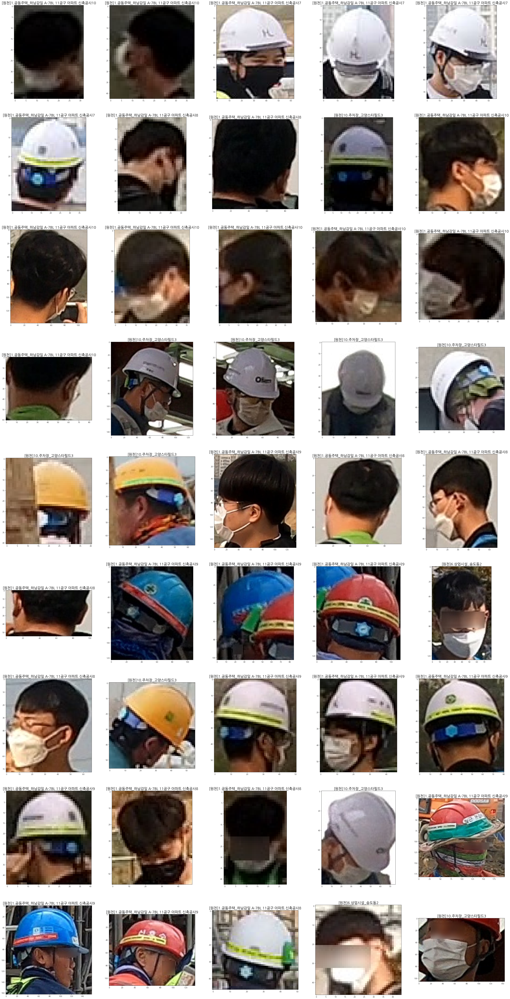

In [63]:
plt.figure(figsize=(50,100))
for num in range(45):
    plt.subplot(9,5,num+1)
    plt.title(dirnames[num],fontdict = {'fontsize' : 20})
    plt.imshow(result[2][num+alpha])

In [10]:
for i in range(4):
    print(i)
    print(result['2name'][i])

0
S2-N2105M23291.jpg
1
S2-N0509M00883.jpg
2
S2-N0509M00883.jpg
3
S2-N0509M00883.jpg


In [19]:
result

{1: [array([[[155, 156, 151],
          [214, 215, 210],
          [236, 237, 232],
          ...,
          [ 87,  69,  67],
          [ 83,  65,  63],
          [ 76,  58,  56]],
  
         [[158, 159, 154],
          [216, 217, 212],
          [236, 237, 232],
          ...,
          [ 85,  64,  63],
          [ 83,  63,  62],
          [ 76,  56,  55]],
  
         [[154, 155, 150],
          [208, 209, 204],
          [234, 235, 230],
          ...,
          [ 82,  58,  58],
          [ 83,  59,  59],
          [ 75,  54,  53]],
  
         ...,
  
         [[145, 147, 142],
          [151, 156, 152],
          [159, 165, 161],
          ...,
          [ 14,   8,  12],
          [ 13,   6,  13],
          [ 14,   9,  15]],
  
         [[149, 151, 146],
          [147, 152, 148],
          [161, 167, 163],
          ...,
          [ 11,   6,  12],
          [ 12,   7,  14],
          [ 14,  11,  18]],
  
         [[149, 154, 147],
          [153, 159, 155],
          [169, 178, 

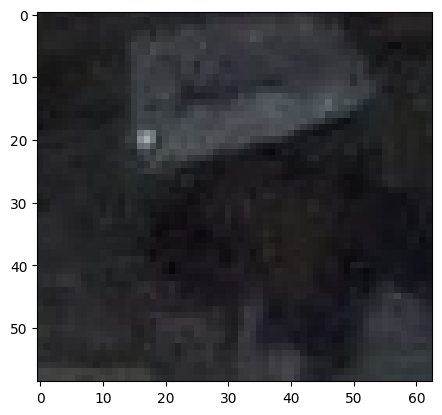

In [20]:
plt.imshow(result[1][4])

In [16]:
print(len(result[1]))
print(len(result[2]))


8771
2795


In [21]:
nb_data = len(result[1]) + len(result[2])

In [22]:
cls = np.ones(nb_data)
cls[8771:] = 0

In [23]:
cls

array([1., 1., 1., ..., 0., 0., 0.])

In [25]:
width = []
height = []
w_perh = []
for i in range(nb_data):
    if i < 8771:
        width.append(result[1][i].shape[1])
        height.append(result[1][i].shape[0])
        w_perh.append(width[i]/height[i])
    else:
        i -= 8771
        width.append(result[2][i].shape[1])
        height.append(result[2][i].shape[0])
        w_perh.append(width[i]/height[i])

    

In [26]:
df = pd.DataFrame({'cls' : list(cls), 'width' : width, 'height' : height , 'ratio' : w_perh })

In [27]:
df

,cls,width,height,ratio
0,1.0,53,69,0.768116
1,1.0,46,45,1.022222
2,1.0,114,160,0.712500
3,1.0,71,75,0.946667
4,1.0,63,59,1.067797
...,...,...,...,...
11561,0.0,79,95,0.723077
11562,0.0,99,135,1.030303
11563,0.0,81,87,0.770270
11564,0.0,34,50,1.080000


In [46]:
df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ].keys()

Int64Index([   28,   504,   776,   908,  1047,  1547,  2319,  2483,  2818,
             2969,  3361,  3954,  4058,  4143,  4498,  4711,  4761,  5027,
             5043,  5954,  6169,  6524,  6541,  7284,  7456,  7688,  7926,
             8310,  8631,  8799,  9275,  9547,  9679,  9818, 10318, 11090,
            11254],
           dtype='int64')

In [57]:
(df.ratio < 2.5) * (df.ratio > 1.5)

0        False
1        False
2        False
3        False
4        False
         ...  
11561    False
11562    False
11563    False
11564    False
11565    False
Name: ratio, Length: 11566, dtype: bool

In [56]:
df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ]

28       1.600000
504      1.764706
776      1.769231
908      1.608696
1047     1.532258
1547     1.892308
2319     1.568807
2483     1.651163
2818     2.075676
2969     1.734177
3361     1.726619
3954     1.612903
4058     1.564516
4143     1.534884
4498     2.024096
4711     1.511364
4761     1.532110
5027     1.585714
5043     2.032258
5954     1.540000
6169     1.746667
6524     1.586667
6541     1.957143
7284     1.718750
7456     1.980769
7688     1.610169
7926     1.784314
8310     2.000000
8631     1.898551
8799     1.600000
9275     1.764706
9547     1.769231
9679     1.608696
9818     1.532258
10318    1.892308
11090    1.568807
11254    1.651163
Name: ratio, dtype: float64

In [58]:
df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ]

28       1.600000
504      1.764706
776      1.769231
908      1.608696
1047     1.532258
1547     1.892308
2319     1.568807
2483     1.651163
2818     2.075676
2969     1.734177
3361     1.726619
3954     1.612903
4058     1.564516
4143     1.534884
4498     2.024096
4711     1.511364
4761     1.532110
5027     1.585714
5043     2.032258
5954     1.540000
6169     1.746667
6524     1.586667
6541     1.957143
7284     1.718750
7456     1.980769
7688     1.610169
7926     1.784314
8310     2.000000
8631     1.898551
8799     1.600000
9275     1.764706
9547     1.769231
9679     1.608696
9818     1.532258
10318    1.892308
11090    1.568807
11254    1.651163
Name: ratio, dtype: float64

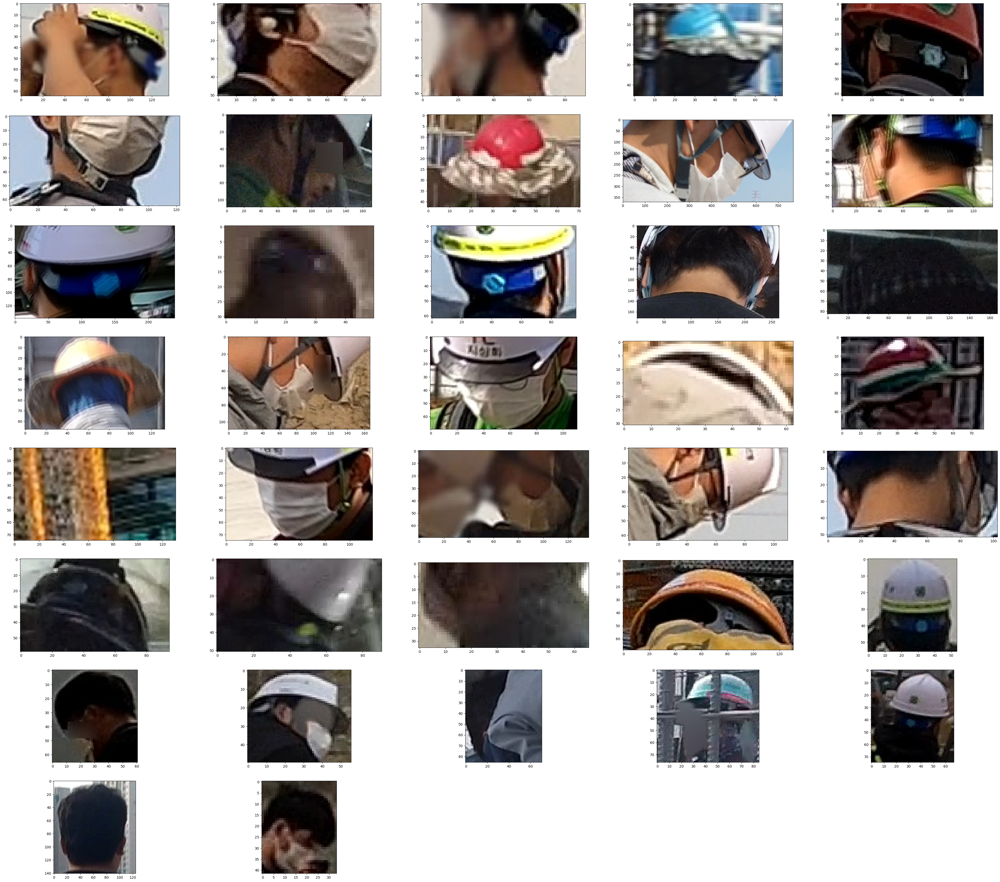

In [49]:
plt.figure(figsize=(50,50))
for i,num in enumerate(df.ratio[(df.ratio < 2.5) * (df.ratio > 1.5) ].keys()):
    plt.subplot(9,5,i+1)
    if (num < 8771):
        plt.imshow(result[1][num])
    else:
        plt.imshow(result[2][num-8771])


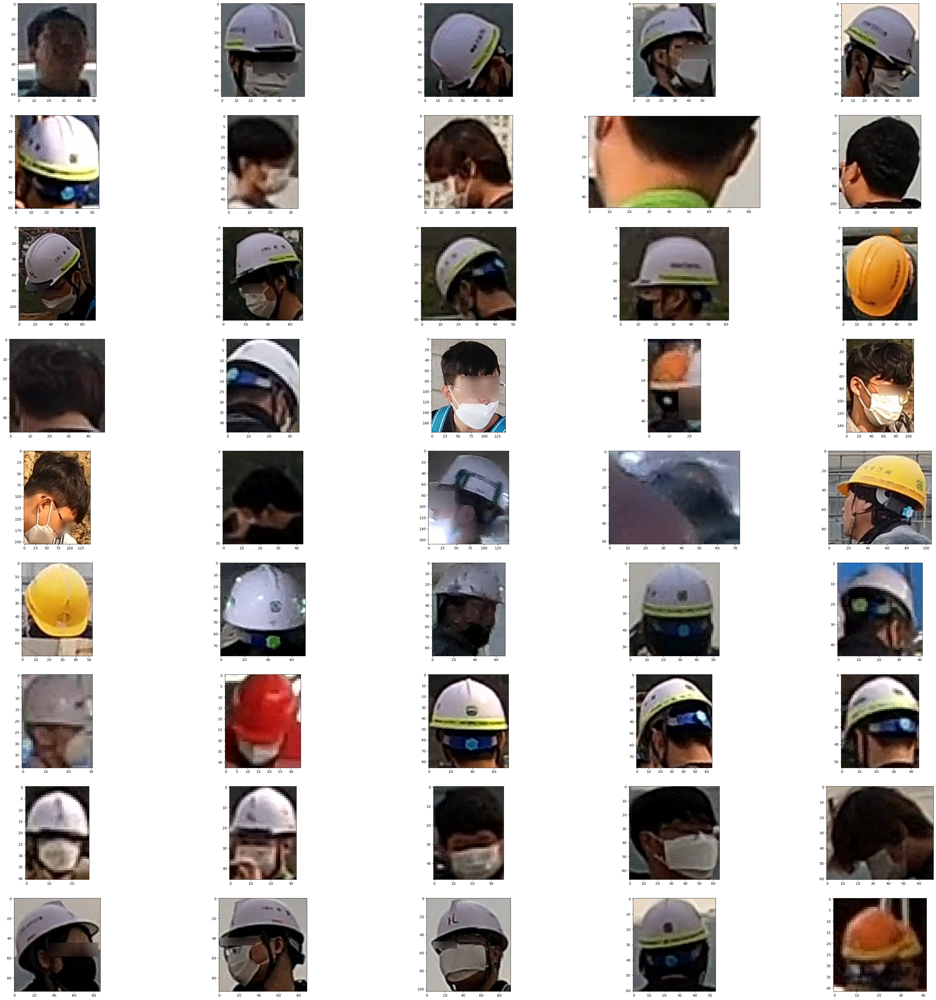

In [71]:
plt.figure(figsize=(50,50))
for num in range(45):
    
    plt.subplot(9,5,num+1)
    plt.imshow(result[2][num])

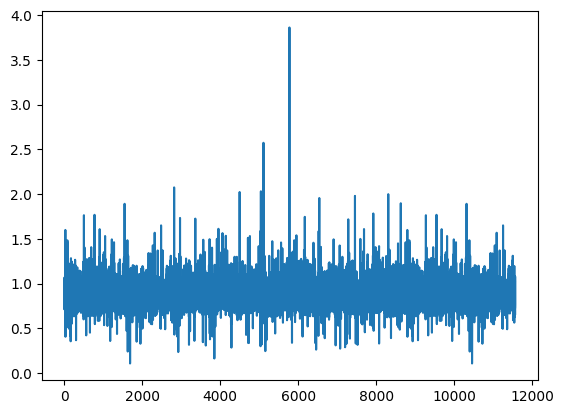

In [30]:
plt.plot(df.ratio)

In [41]:
fig = plt.figure(figsize = (20,14))
plt.subplot(rows, columns, image_index)

plt.subplot(1,2)
plt.imshow(result[1][5775])
plt.imshow(result[1][5775])
plt.show()

TypeError: subplot() takes 1 or 3 positional arguments but 2 were given

<Figure size 2000x1400 with 0 Axes>

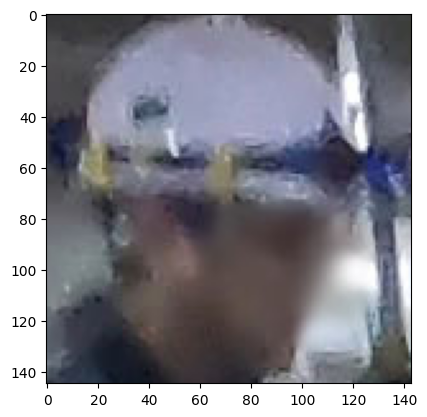

In [69]:
plt.imshow(result[2][9818-8774])